In [1]:
from analyze import *
from duplicates import *
from balance import generate_autoencoder

In [2]:
import pandas as pd
from tensorflow import keras
import os
import csv
from matplotlib import pyplot as plt
%config InteractiveShell.autoprint = False

In [3]:
df = pd.read_csv('../Combined_AM_Data.csv')
all_pid = list(df['id'].unique())
len(all_pid)

26

In [4]:
columns_needed = ['id','income', 'road_dist', 'cooking', 'y_am_pef', 'tempin', 
                    'humidin', 'pm25in', 'co2in', 'tempdiffin', 'humidiffin', 
                    'pm25diffin', 'pm10', 'pm25', 'o3', 'no2', 'co', 'so2', 'temp', 
                    'windsd', 'humid', 'varp', 'dewpt', 'airp', 'seap', 'solrhr', 'solramnt', 'grdt', 'class']

cleaned_df = df.filter(columns_needed)
all_patients_df = cleaned_df.dropna()

In [5]:

# print(os.getcwd())
# os.mkdir(os.path.join(os.curdir, "TEST"))
# os.chdir(os.path.join(os.curdir, "TEST"))
# print(os.getcwd())

# os.chdir(os.path.join(os.curdir, ".."))

In [6]:
output = []

Processing patient: SB-001
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-003
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-008
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-011
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-012
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-022
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-023
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-025
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-028
Training completed
Similarity

c:\Local Disk D\Research\Research-Project\Experiments\Sartaj\AutoEncoder\Individual Patient\HeavyDecoder\analyze.py:147: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))


Processing patient: SB-081
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-082
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-083
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-089
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated
Processing patient: SB-112
Training completed
Similarity 1 calculated
Similarity 2 calculated
Similarity 3 calculated


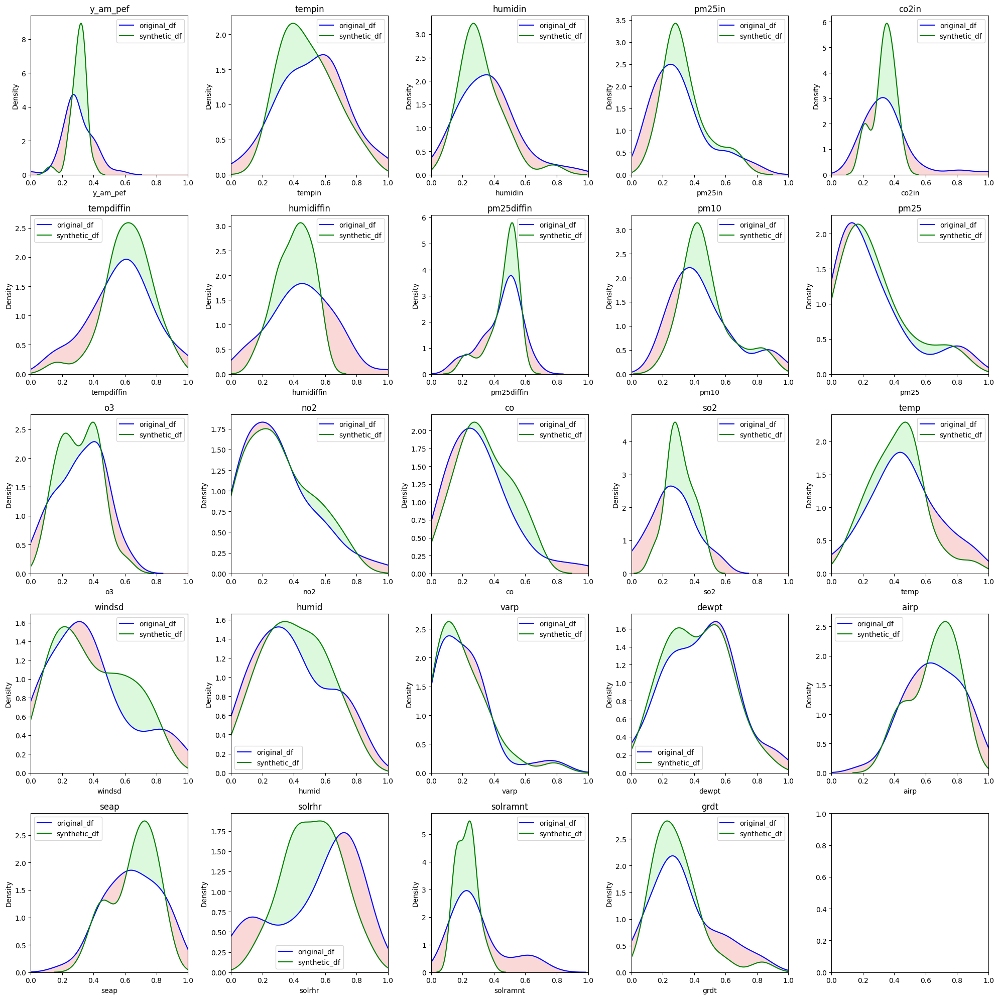

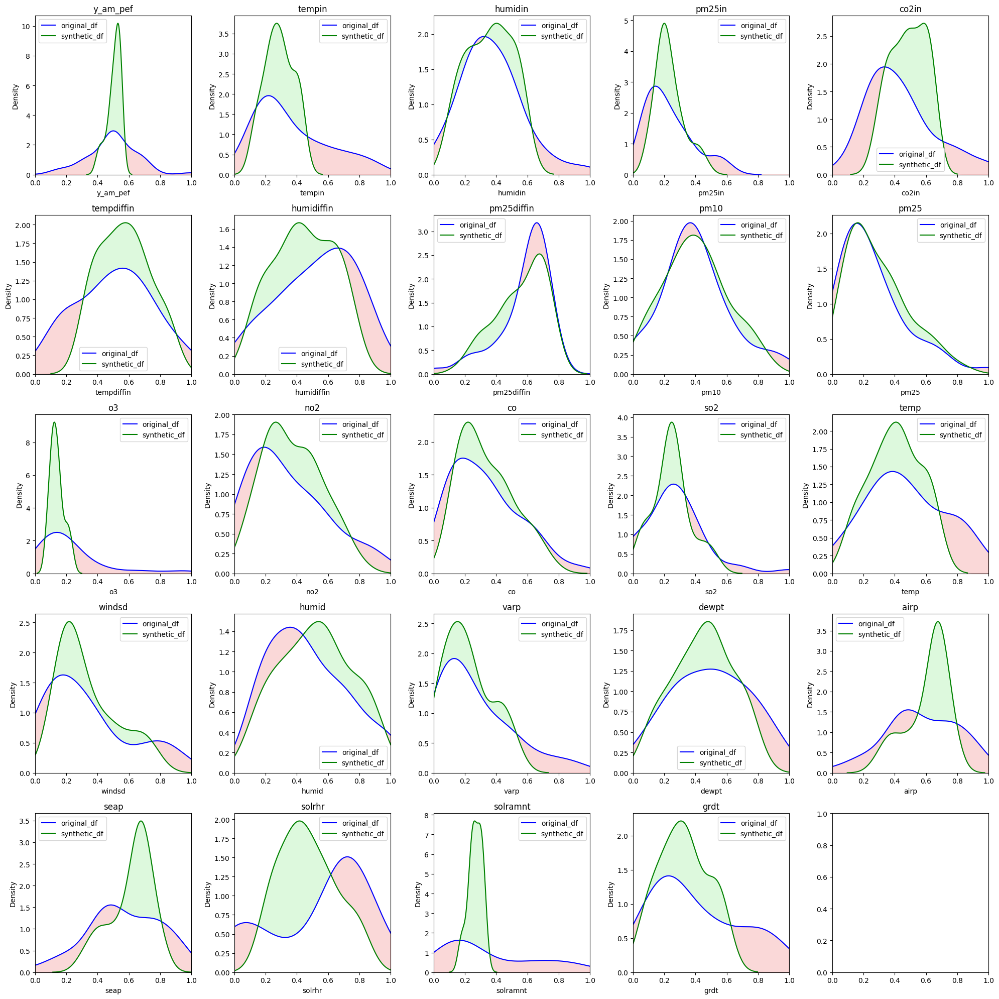

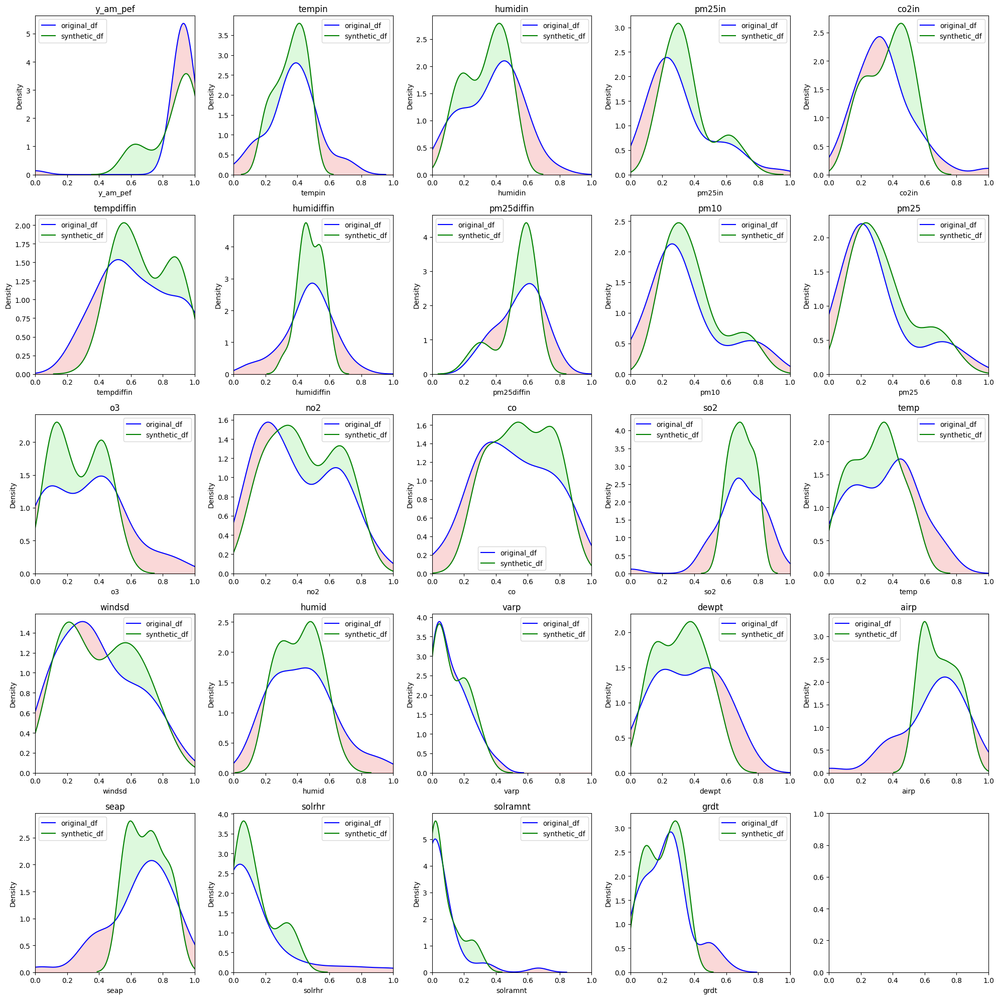

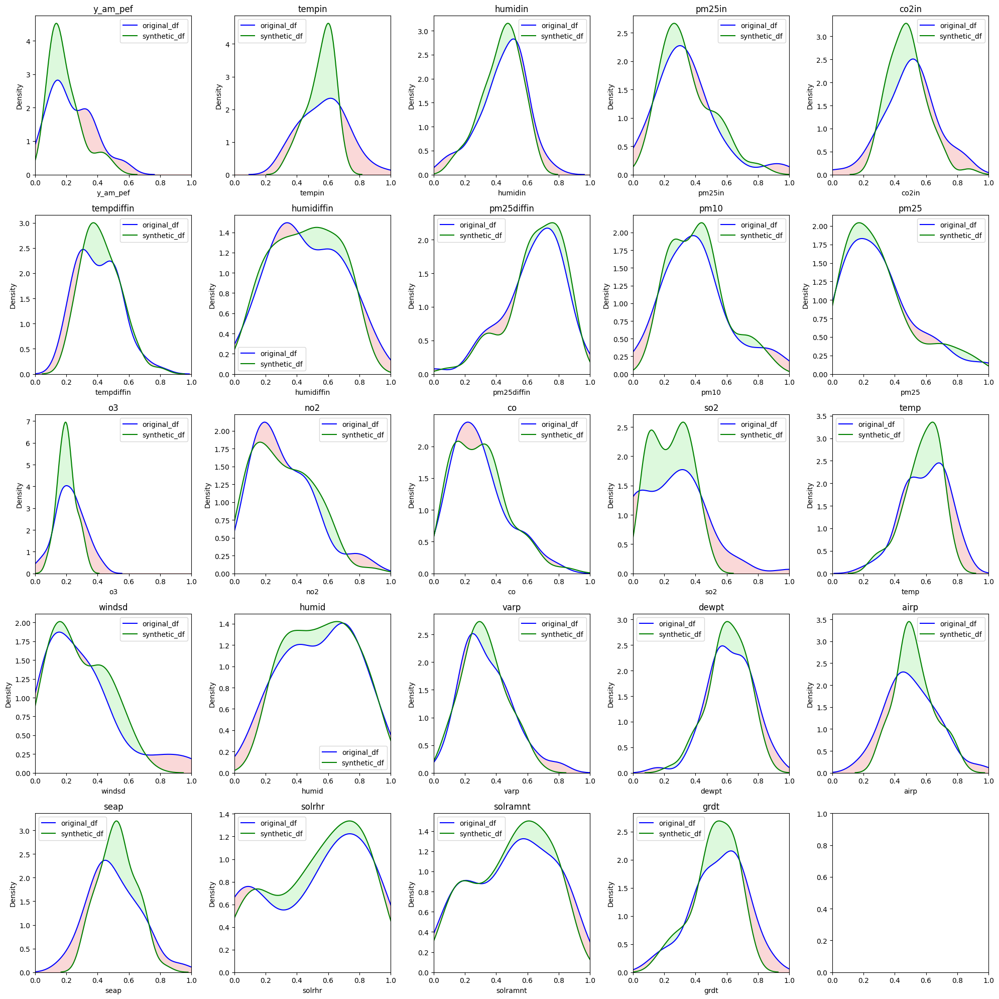

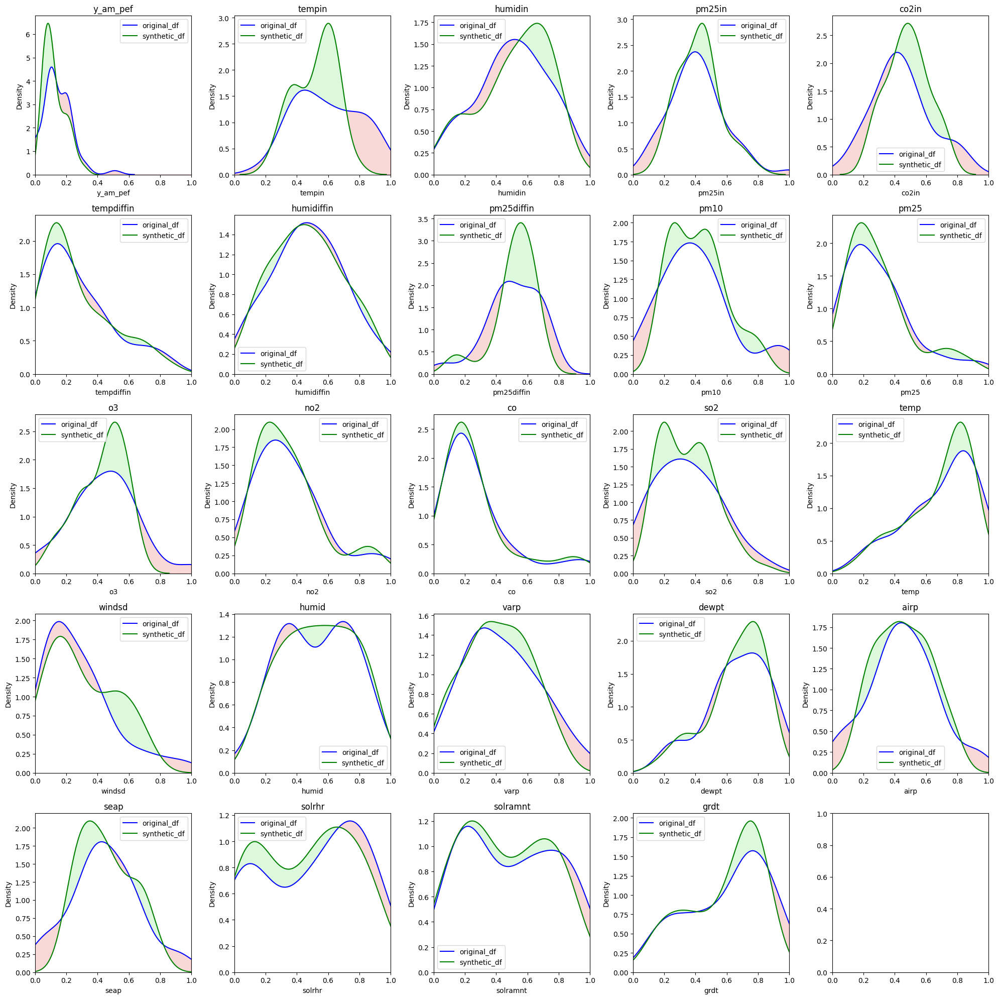

...

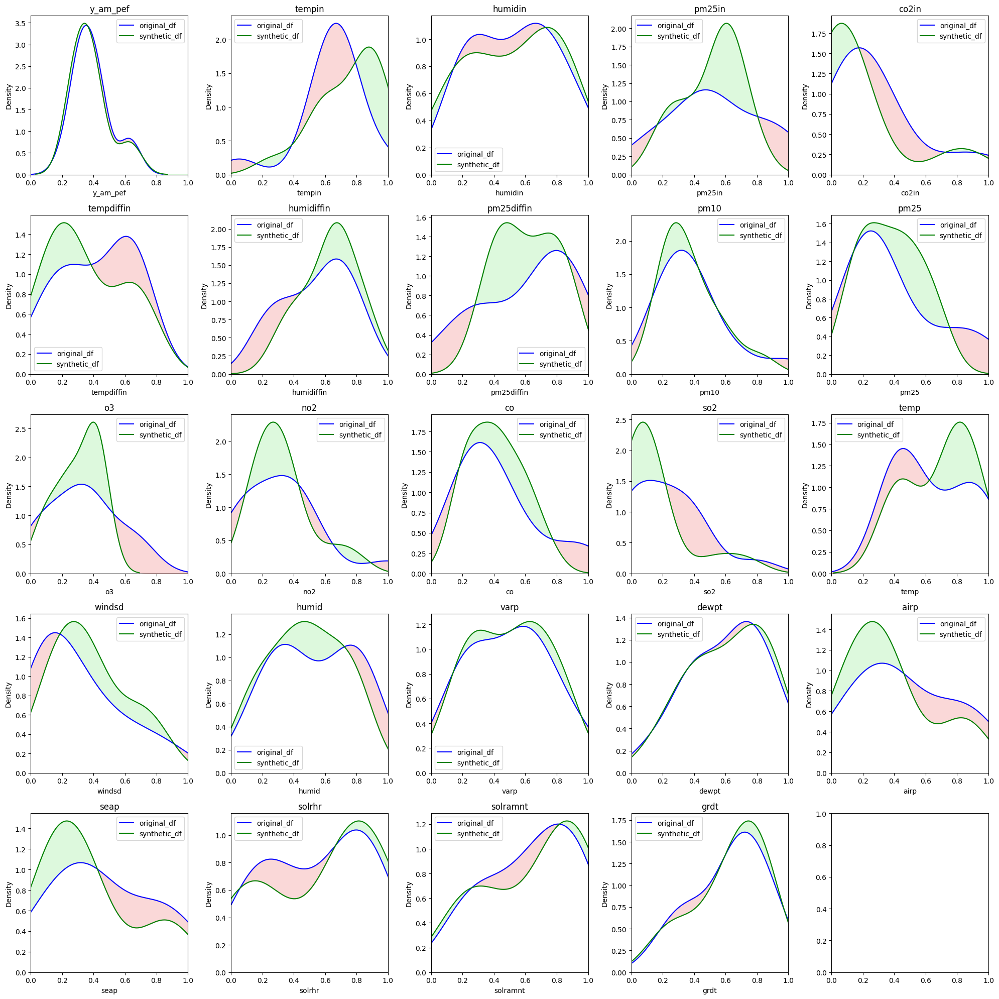

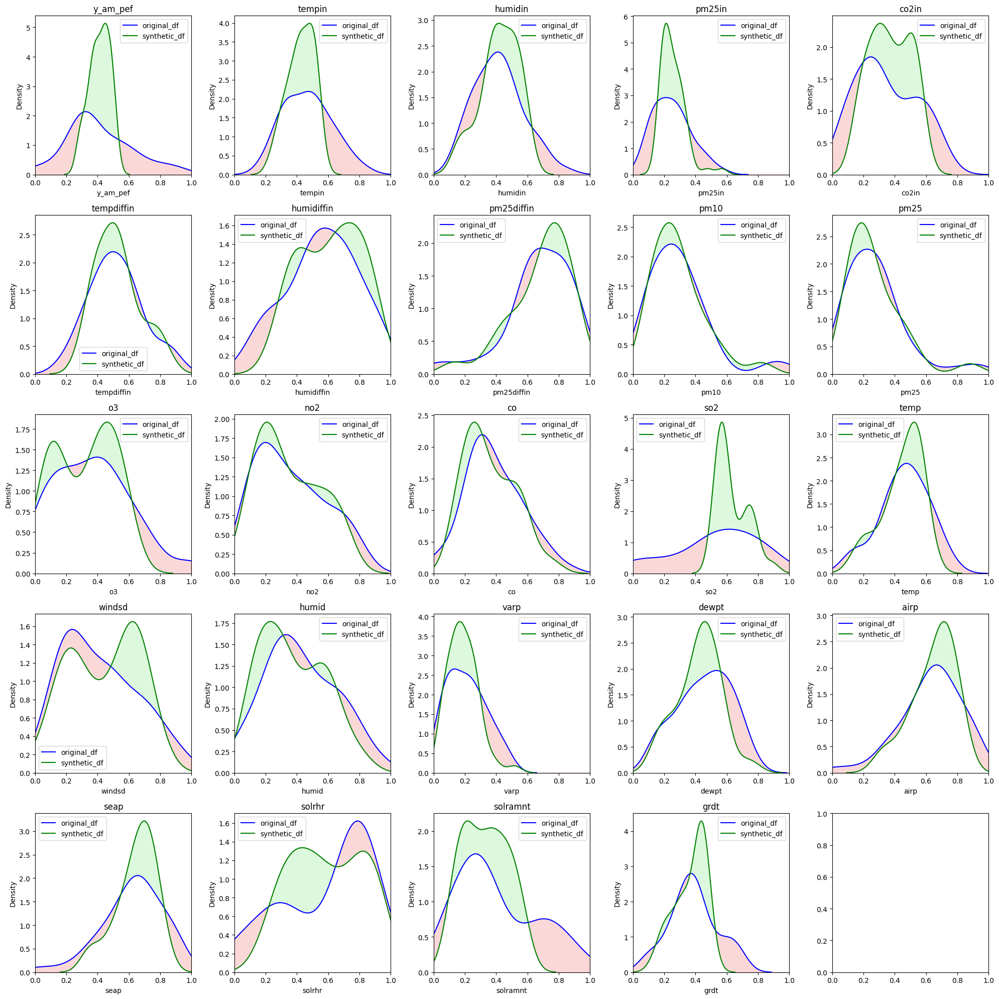

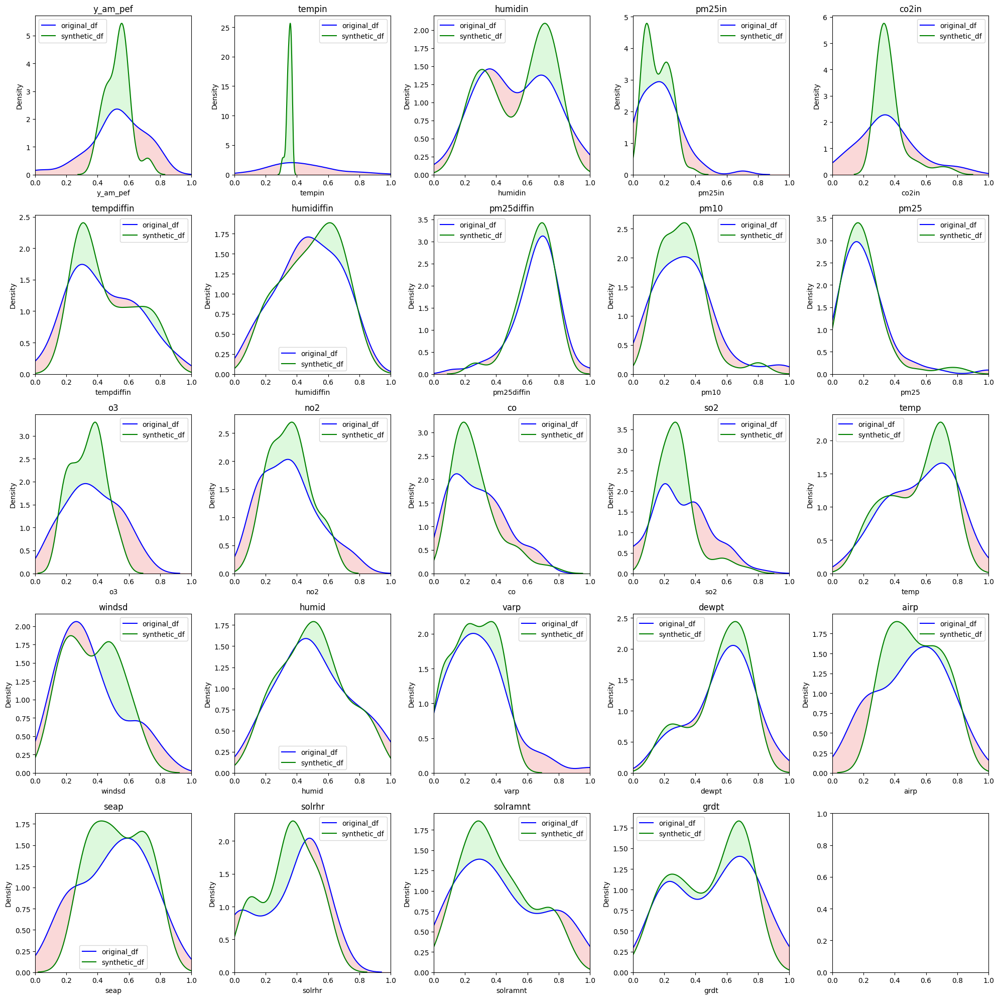

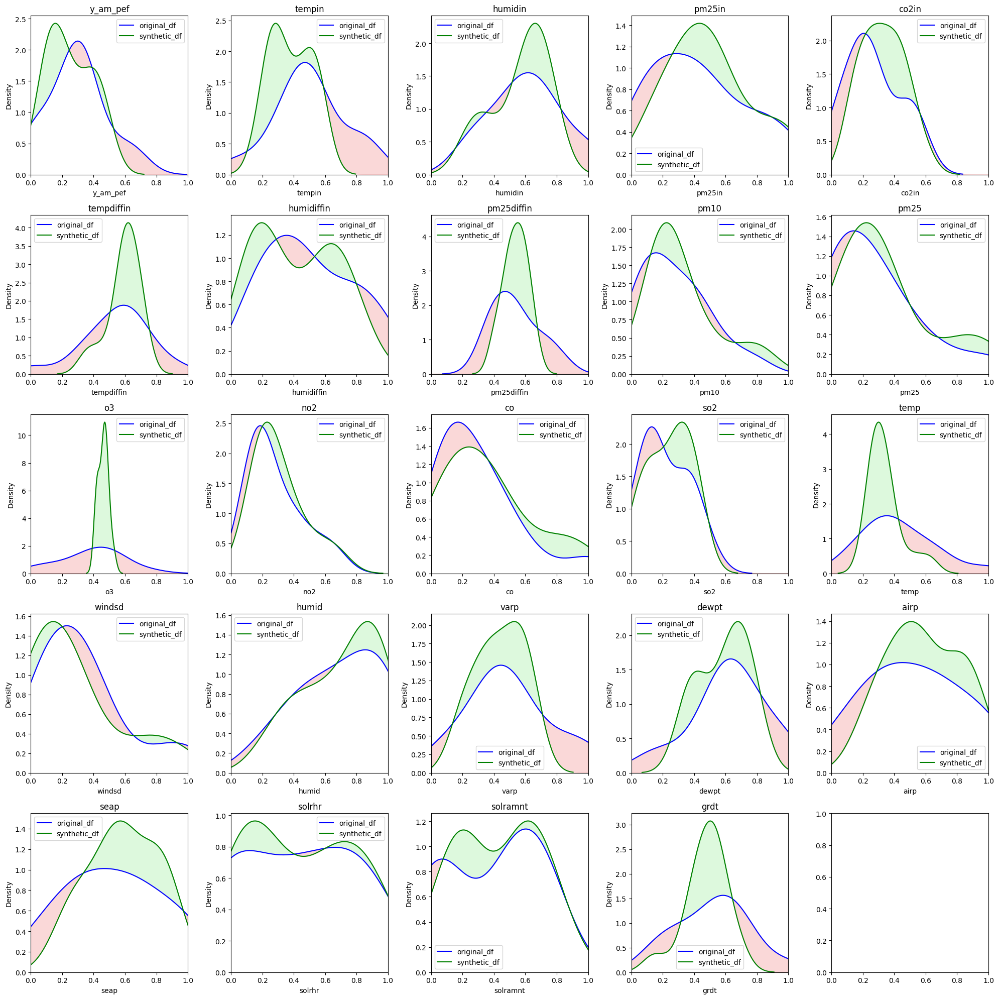

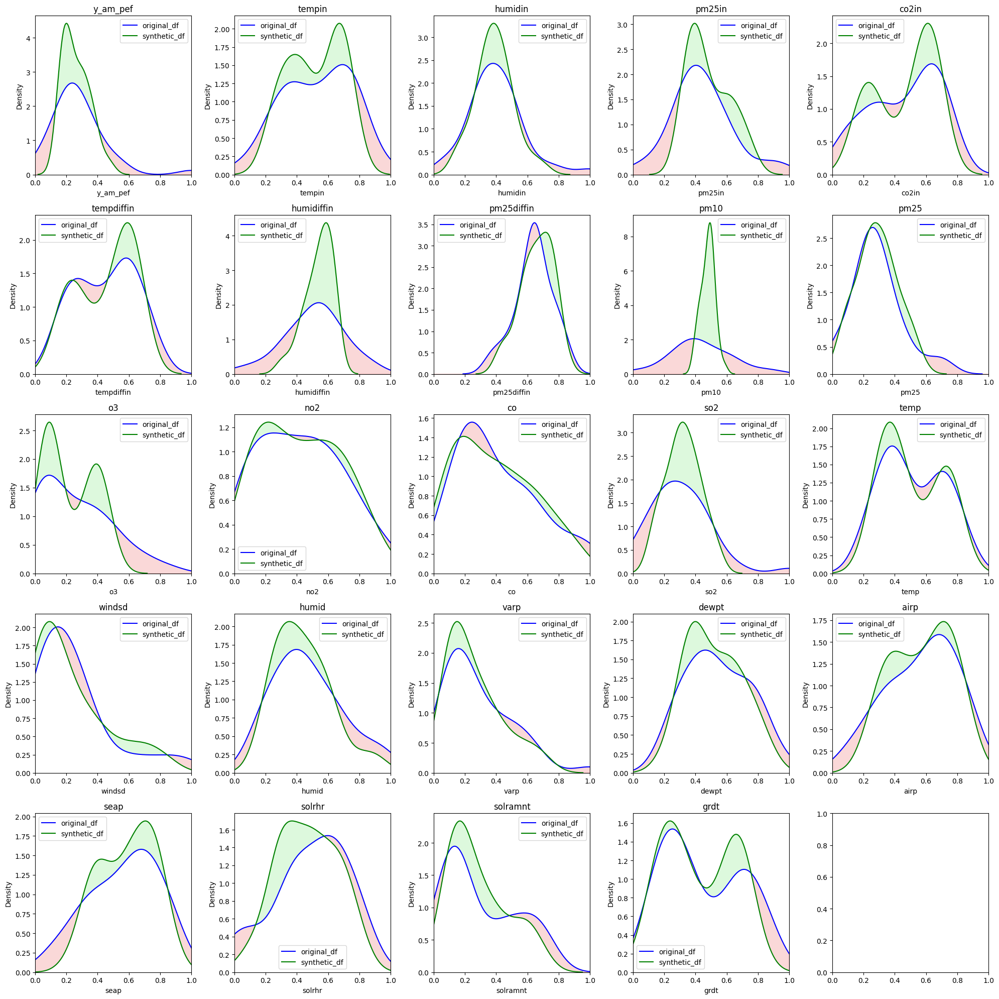

In [7]:
for patient in all_pid:
    try:
        print(f"Processing patient: {patient}")
        results = []
        os.mkdir(os.path.join(os.curdir, patient))
        # os.chdir(os.path.join(os.curdir, patient))

        patient_df = all_patients_df[all_patients_df['id'] == patient].copy()

        patient_default_income = patient_df['income'].iloc[0]
        patient_default_read_dist = patient_df['road_dist'].iloc[0]
        patient_default_cooking = patient_df['cooking'].iloc[0]

        patient_df.drop(['id', 'income', 'road_dist', 'cooking'], axis=1, inplace=True)

        patient_minority_data = patient_df[patient_df['class'] == 0].copy()
        #patient_majority_data = patient_df[patient_df['class'] != 0].copy()
        patient_minority_data.drop(['class'], axis=1, inplace=True)

        #L27_E22_20_B16_D18_20_22_24
        input_shape = patient_minority_data.shape[1]
        encoder_dense_layers = [22, 20]
        bottle_neck = 16
        decoder_dense_layers = [18, 20, 22]
        decoder_activation = 'sigmoid'

        epochs = 200
        batch_size = 16
        validation_split = 0.25
        verbose = 0

        autoencoder, _ , _ = generate_autoencoder(input_shape = input_shape, encoder_dense_layers=encoder_dense_layers,
                                                bottle_neck=bottle_neck, decoder_dense_layers=decoder_dense_layers,
                                                decoder_activation=decoder_activation)

        opt = keras.optimizers.Adam(learning_rate=0.001)
        autoencoder.compile(opt, loss="mse")
        history = autoencoder.fit(patient_minority_data, patient_minority_data, 
                                epochs=epochs, batch_size=batch_size, 
                                validation_split=validation_split, 
                                verbose=verbose)
        print("Training completed")
        last_epoch_loss = history.history['loss'][-1]
        last_epoch_val_loss = history.history['val_loss'][-1]

        num_samples = patient_minority_data.shape[0]
        patient_minority_synthetic_data = autoencoder.predict(patient_minority_data,verbose=verbose)
        patient_minority_synthetic_data = pd.DataFrame(patient_minority_synthetic_data, columns=patient_minority_data.columns)

        duplicates = Duplicates(original_df=patient_minority_data, synthetic_df=patient_minority_synthetic_data)

        num_duplicates_original_df, num_duplicates_synthetic_df, num_rows_present = duplicates.identify_duplicates()

        similarity_1 = duplicates.calculate_similarity(threshold=0.01)
        print("Similarity 1 calculated")
        similarity_2 = duplicates.calculate_similarity(threshold=0.25)
        print("Similarity 2 calculated")
        similarity_3 = duplicates.calculate_similarity(threshold=0.50)
        print("Similarity 3 calculated")

        analyze = Analyze(original_df=patient_minority_data, synthetic_df=patient_minority_synthetic_data)
        plt, total_highlighted_area, avg_kl_div  =  analyze.plot_density()

        # raw_score = -1
        # score = -1
        # try:
        #     report = analyze.gretel_metric()
        #     raw_score = report['raw_score']
        #     score = report['score']
        # except:
        #     print(f"Error in {patient} gretel_metric")

        patient_minority_data['income'] = patient_default_income
        patient_minority_data['road_dist'] = patient_default_read_dist
        patient_minority_data['cooking'] = patient_default_cooking
        patient_minority_data['class'] = 0

        patient_minority_synthetic_data['income'] = patient_default_income
        patient_minority_synthetic_data['road_dist'] = patient_default_read_dist
        patient_minority_synthetic_data['cooking'] = patient_default_cooking
        patient_minority_synthetic_data['class'] = 0

        patient_minority_data.to_csv(os.path.join(os.curdir, patient, 'original_minority_data.csv'), index=False)
        patient_minority_synthetic_data.to_csv(os.path.join(os.curdir, patient, 'generated_minority_data.csv'), index=False) 
        plt.savefig(os.path.join(os.curdir, patient, 'density_plot.png'))  
        plt = None

        results.append([patient, last_epoch_loss, last_epoch_val_loss, num_samples, 
                        num_duplicates_original_df, num_duplicates_synthetic_df, num_rows_present,
                        similarity_1, similarity_2, similarity_3, total_highlighted_area, avg_kl_div])
        output.append(results)

        with open('result.csv', 'a', newline='') as csvfile:
            csv_writer = csv.writer(csvfile)
            csv_writer.writerow(results)

    except Exception as e:
        print("Error in patient: ", patient)
        print(e)
        continue


In [8]:
for p in output:
    print(p)

[['SB-001', 0.008020656183362007, 0.02695453353226185, 57, 0, 0, 0, [0, 0.0, 0, 0.0, 0.0], [0, 0.0, 0, 0.21052631578947367, 0.0], [0, 0.0, 10, 1.263157894736842, 0.08771929824561403], 3.686399035877722, 0.6862232976543009]]
[['SB-003', 0.013606708496809006, 0.07015511393547058, 45, 0, 0, 0, [0, 0.0, 0, 0.0, 0.0], [0, 0.0, 0, 0.6222222222222222, 0.0], [0, 0.0, 3, 2.022222222222222, 0.03333333333333333], 4.962510331028918, 5.5108432059098655]]
[['SB-008', 0.007360383868217468, 0.043457165360450745, 43, 0, 0, 0, [0, 0.0, 0, 0.0, 0.0], [0, 0.0, 0, 0.2558139534883721, 0.0], [0, 0.0, 0, 0.9069767441860465, 0.0], 3.7473913455530643, 0.7175317248803795]]
[['SB-011', 0.0077293082140386105, 0.012693671509623528, 63, 0, 0, 0, [0, 0.0, 0, 0.0, 0.0], [0, 0.0, 0, 0.1746031746031746, 0.0], [2, 0.031746031746031744, 7, 1.619047619047619, 0.05555555555555555], 2.4877783310946047, 0.187443291394456]]
[['SB-012', 0.007446642965078354, 0.014726880006492138, 57, 0, 0, 0, [0, 0.0, 0, 0.0, 0.0], [0, 0.0, 0, 